<a href="https://colab.research.google.com/github/bryaanabraham/Wandering_Guardian/blob/main/ML%20Implementation/Complete_Model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import math
import numpy as np
import folium
import random
import time
from geopy.distance import geodesic
from sklearn.ensemble import IsolationForest
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from statistics import mode

Dataset includes longitude and latitude values which is used to train a model for path prediction

In [2]:
coords = pd.read_csv("training_dataset.csv")
coords = coords.dropna(how='all')
coords.head()

,longitude,latitude,path_id
0,12.821062,80.044729,1.0
1,12.821219,80.044743,1.0
2,12.821479,80.044736,1.0
3,12.821561,80.044743,1.0
4,12.821636,80.044743,1.0


Visual Representation of all data points with a scatter plot

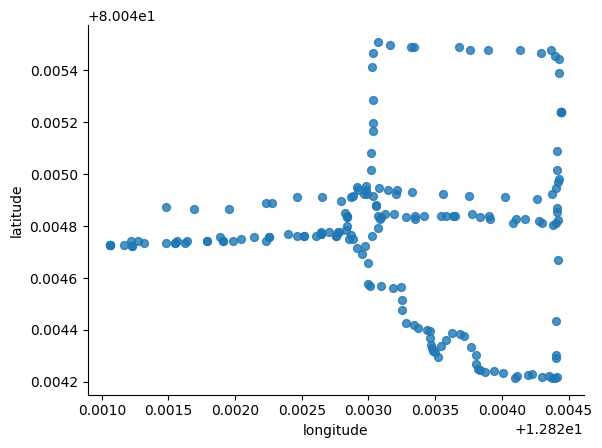

In [3]:
coords.plot(kind='scatter', x='longitude', y='latitude', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

A list of data frames is made to seperate each path taken on the basis of 'path_id' attribute

In [4]:
path = []
for i in range(1,len(coords['path_id'].unique())):
    path.append(coords[coords['path_id'] == i])

Outlier analysis and pruning of individual paths is done

C:\Users\bryan\AppData\Local\Temp\ipykernel_16180\4264214775.py:18: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(data[:, 0], data[:, 1], c=colors, cmap='coolwarm', marker='o', label='Normal')


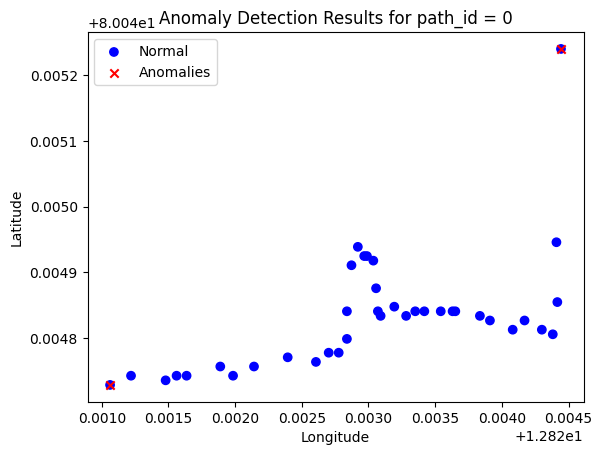

Anomalies detected in navigation path.


C:\Users\bryan\AppData\Local\Temp\ipykernel_16180\4264214775.py:18: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(data[:, 0], data[:, 1], c=colors, cmap='coolwarm', marker='o', label='Normal')


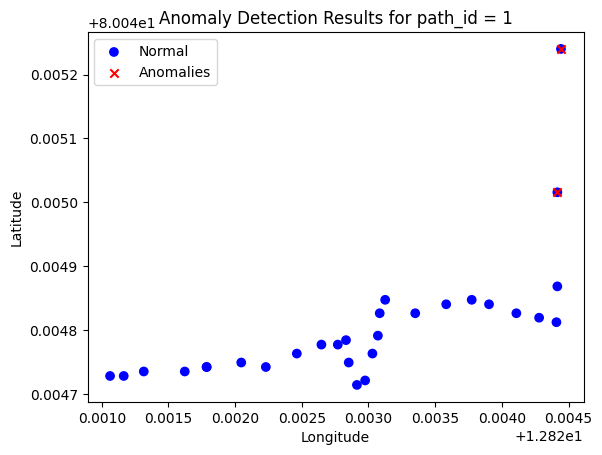

Anomalies detected in navigation path.


C:\Users\bryan\AppData\Local\Temp\ipykernel_16180\4264214775.py:18: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(data[:, 0], data[:, 1], c=colors, cmap='coolwarm', marker='o', label='Normal')


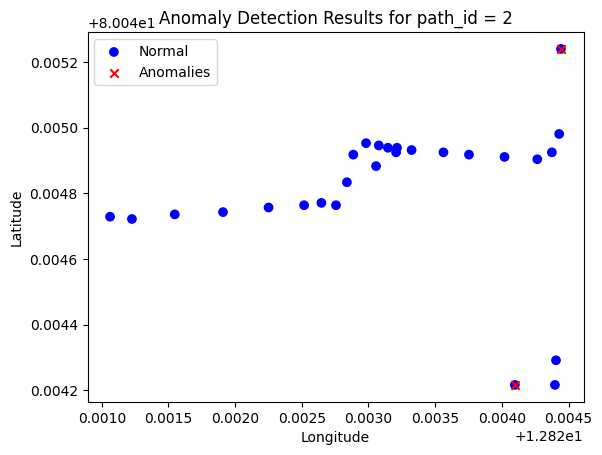

Anomalies detected in navigation path.


C:\Users\bryan\AppData\Local\Temp\ipykernel_16180\4264214775.py:18: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(data[:, 0], data[:, 1], c=colors, cmap='coolwarm', marker='o', label='Normal')


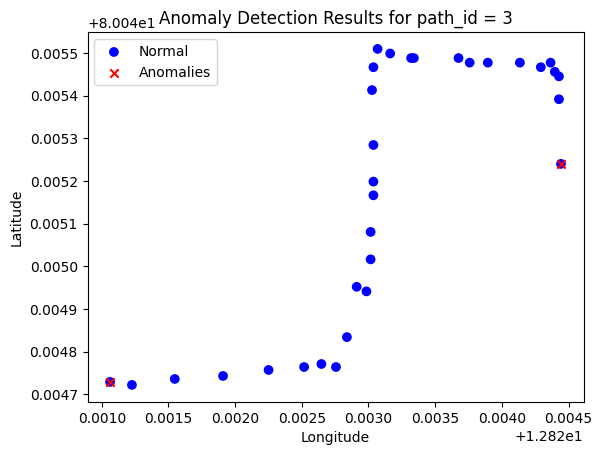

Anomalies detected in navigation path.


In [5]:
from sklearn.ensemble import IsolationForest

n = len(coords['path_id'].unique()) - 1

for i in range(n):
    data = np.vstack((path[i]['longitude'], path[i]['latitude'])).T

    labels = np.array([0] * len(path[i]))

    model = IsolationForest(contamination=0.05, random_state=42)
    model.fit(data)

    predictions = model.predict(data)
    anomaly_indices = np.where(predictions == -1)[0]

    colors = np.where(labels == 0, 'blue', 'red')

    plt.scatter(data[:, 0], data[:, 1], c=colors, cmap='coolwarm', marker='o', label='Normal')
    plt.scatter(data[anomaly_indices, 0], data[anomaly_indices, 1], color='red', marker='x', label='Anomalies')
    plt.legend()
    plt.title(f"Anomaly Detection Results for path_id = {i}")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.show()

    if len(anomaly_indices) > 0:
        print("Anomalies detected in navigation path.")
        # Filter out anomalies from dataframe
        path[i] = path[i][~path[i].index.isin(anomaly_indices)]
        # Reset index after filtering
        path[i] = path[i].reset_index(drop=True)
    else:
        print("No anomalies detected in navigation path.")


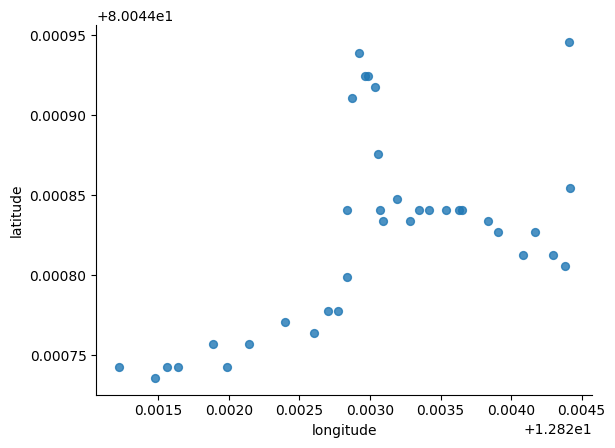

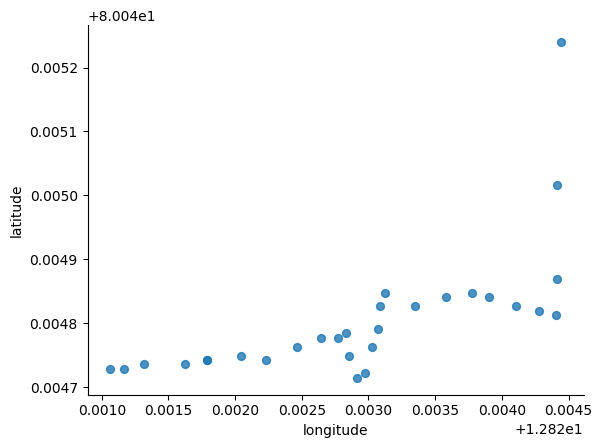

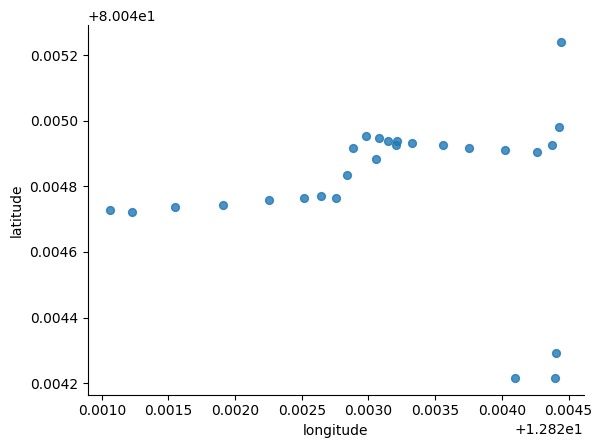

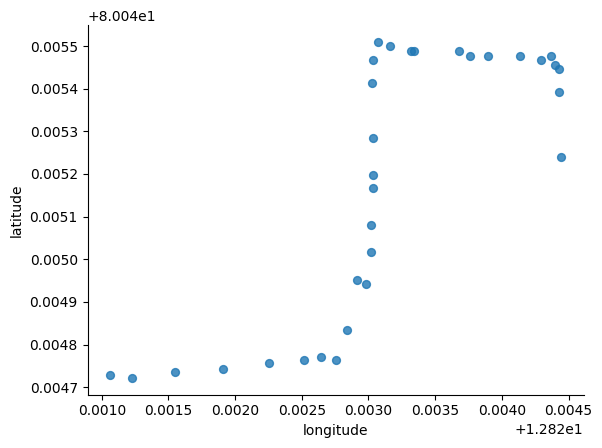

In [6]:
# data after outlier pruning
n = len(coords['path_id'].unique())-1
for i in range(n):
   path[i].plot(kind='scatter', x='longitude', y='latitude', s=32, alpha=.8)
   plt.gca().spines[['top', 'right',]].set_visible(False)

Visual Representation of Individual paths on a Folium Map

In [7]:
maps = []

max_lat = max(coords['longitude'])
min_lat = min(coords['longitude'])
min_lon = min(coords['latitude'])
max_lon = max(coords['latitude'])

n = len(coords['path_id'].unique())-1

# each path_id has its own map
for i in range(0,n):

  m = folium.Map()
  gps_path = list(zip(path[i]['longitude'], path[i]['latitude']))
  folium.PolyLine(locations=gps_path, color='blue', weight=2.5, opacity=0.8).add_to(m)
  folium.Marker(gps_path[20], icon=folium.Icon(color='blue'), popup=f'Safe Path').add_to(m)

  m.fit_bounds([(min_lat, min_lon), (max_lat, max_lon)])
  maps.append(m)

  display(maps[i])


Testing dataset is included

In [8]:
testing_coords = pd.read_csv("testing_dataset.csv")
testing_coords = coords.dropna(how='all')
testing_coords.head()

,longitude,latitude,path_id
0,12.821062,80.044729,1.0
1,12.821219,80.044743,1.0
2,12.821479,80.044736,1.0
3,12.821561,80.044743,1.0
4,12.821636,80.044743,1.0


Testing dataset is split into lists based on 'path_id' attribute as done before

In [9]:
testing_path = []
for i in range(1, len(testing_coords['path_id'].unique())):
    testing_path.append(testing_coords[testing_coords['path_id'] == i])

Model for predicting path taken is made to predict which path is taken based on the current coordinate values. Model is trained on the 'training' dataset <br>X represents the feautures i.e. longitude and latitude<br>y represents the target variable that is path_id<br>Constraint: Accuracy is low due to overlapping paths

In [10]:
X = coords.drop(columns=['path_id'])
y = coords['path_id']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = RandomForestClassifier(random_state=42)

model.fit(X_train, y_train)
y_pred = model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

n = len(testing_coords['path_id'].unique())-1

for i in range(n):
  new_X = testing_path[i].drop(columns=['path_id'])
  predicted_path_ids = model.predict(new_X)

  print(f"Predicted Paths IDs for path '{i+1}':", end=": ")
  for path_id in predicted_path_ids:
      print(path_id, end = ", ")
  print()
  mode_path_id = mode(predicted_path_ids)
  print(f"Mode of Predicted Paths: {mode_path_id:.0f}", end = "\n\n")

Accuracy: 0.6052631578947368
Predicted Paths IDs for path '1':: 4.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 3.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 3.0, 3.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 5.0, 
Mode of Predicted Paths: 1

Predicted Paths IDs for path '2':: 4.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 5.0, 
Mode of Predicted Paths: 2

Predicted Paths IDs for path '3':: 4.0, 4.0, 4.0, 3.0, 4.0, 3.0, 3.0, 4.0, 4.0, 1.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 5.0, 3.0, 3.0, 3.0, 
Mode of Predicted Paths: 3

Predicted Paths IDs for path '4':: 4.0, 4.0, 4.0, 3.0, 4.0, 3.0, 3.0, 4.0, 4.0, 3.0, 3.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 5.0, 
Mode of Predicted Paths: 4



Function to determine the perpendicular distance of current coordinate from the closest point on the predited path<br>The ML model will predict the 'path_id' based on current coordinates. To determine the deviation from the path, the distance between the current coordinate and closest point to that coordinate on the predicted path is calculated.

In [11]:
def distance(current_point, coords_path):
    nearest_point_on_line = min(coords_path, key=lambda point: geodesic(point, current_point).meters)
    return geodesic(current_point, nearest_point_on_line).meters

Assigns colour based on deviation from path<br>In case of incoming data blue colour is used

In [12]:
def assign_color(distance, flag):
  if flag == False:
    if distance <= 15:
        return 'green'
    elif distance >= 25:
        return 'red'
    else:
        return 'orange'
  elif flag == True:
    return 'blue'

List of colours who's index represent a specific 'path_id'

In [13]:
colors = ['gold','red','green','purple','black','brown','maroon','navy','teal','olive','aqua']

Demo of pseudo real time implementation<br>ML model is predicting the path taking the 'testing' dataset as input.

In [14]:
max_lat = max(testing_path[0]['longitude'])
min_lat = min(testing_path[0]['longitude'])
min_lon = min(testing_path[0]['latitude'])
max_lon = max(testing_path[0]['latitude'])
flag = False

l = len(testing_path)
for j in range(l):
  m = folium.Map()
  input_coords = []
  n = len(testing_path[j]) - 1
  for i in range(0, n, 2):
    input_data = testing_path[j].iloc[[i]].drop(columns=['path_id'])
    predicted_path_ids = model.predict(input_data)
    prediction = int(predicted_path_ids[0])

    lat = input_data['longitude'].values[0]
    lon = input_data['latitude'].values[0]
    input_coords.append((lat, lon))

    coords_path = list(zip(path[j]['longitude'], path[j]['latitude']))
    folium.PolyLine(locations=coords_path, color='blue', weight=2.5, opacity=0.4).add_to(m)

    input_path = input_coords
    folium.PolyLine(locations=input_path, color=colors[prediction], weight=3, opacity=0.8).add_to(m)

    current_point = (input_data['longitude'].values[-1], input_data['latitude'].values[-1])
    deviation = distance(current_point, coords_path)

    color = assign_color(deviation,flag)
    folium.Marker(location=current_point,
                  popup=f"Deviation: {deviation*1000:.2f} m\nPath_id: {prediction}",
                  icon=folium.Icon(color=color)).add_to(m)

    print(f"Predicted Path_id: {prediction}")
    print(f"True Path_id: {j+1}")
    m.fit_bounds([(min_lat, min_lon), (max_lat, max_lon)])
    display(m)
    if i != n:
          children_copy = list(m._children.values())
          for child in children_copy:
              if isinstance(child, folium.features.PolyLine):
                  m._children.pop(child.get_name())
    if i == n:
      del m
    # time.sleep(1)


Predicted Path_id: 4
True Path_id: 1


Predicted Path_id: 1
True Path_id: 1


Predicted Path_id: 1
True Path_id: 1


Predicted Path_id: 1
True Path_id: 1


Predicted Path_id: 1
True Path_id: 1


Predicted Path_id: 1
True Path_id: 1


Predicted Path_id: 1
True Path_id: 1


Predicted Path_id: 1
True Path_id: 1


Predicted Path_id: 1
True Path_id: 1


Predicted Path_id: 3
True Path_id: 1


Predicted Path_id: 1
True Path_id: 1


Predicted Path_id: 1
True Path_id: 1


Predicted Path_id: 1
True Path_id: 1


Predicted Path_id: 1
True Path_id: 1


Predicted Path_id: 1
True Path_id: 1


Predicted Path_id: 2
True Path_id: 1


Predicted Path_id: 1
True Path_id: 1


Predicted Path_id: 1
True Path_id: 1


Predicted Path_id: 1
True Path_id: 1


Predicted Path_id: 4
True Path_id: 2


Predicted Path_id: 2
True Path_id: 2


Predicted Path_id: 2
True Path_id: 2


Predicted Path_id: 2
True Path_id: 2


Predicted Path_id: 2
True Path_id: 2


Predicted Path_id: 2
True Path_id: 2


Predicted Path_id: 2
True Path_id: 2


Predicted Path_id: 2
True Path_id: 2


Predicted Path_id: 2
True Path_id: 2


Predicted Path_id: 2
True Path_id: 2


Predicted Path_id: 2
True Path_id: 2


Predicted Path_id: 2
True Path_id: 2


Predicted Path_id: 2
True Path_id: 2


Predicted Path_id: 2
True Path_id: 2


Predicted Path_id: 4
True Path_id: 3


Predicted Path_id: 4
True Path_id: 3


Predicted Path_id: 4
True Path_id: 3


Predicted Path_id: 3
True Path_id: 3


Predicted Path_id: 4
True Path_id: 3


Predicted Path_id: 3
True Path_id: 3


Predicted Path_id: 3
True Path_id: 3


Predicted Path_id: 3
True Path_id: 3


Predicted Path_id: 3
True Path_id: 3


Predicted Path_id: 3
True Path_id: 3


Predicted Path_id: 3
True Path_id: 3


Predicted Path_id: 3
True Path_id: 3


Predicted Path_id: 3
True Path_id: 3


Predicted Path_id: 4
True Path_id: 4


Predicted Path_id: 4
True Path_id: 4


Predicted Path_id: 4
True Path_id: 4


Predicted Path_id: 3
True Path_id: 4


Predicted Path_id: 4
True Path_id: 4


Predicted Path_id: 3
True Path_id: 4


Predicted Path_id: 4
True Path_id: 4


Predicted Path_id: 4
True Path_id: 4


Predicted Path_id: 4
True Path_id: 4


Predicted Path_id: 4
True Path_id: 4


Predicted Path_id: 4
True Path_id: 4


Predicted Path_id: 4
True Path_id: 4


Predicted Path_id: 4
True Path_id: 4


Predicted Path_id: 4
True Path_id: 4


Predicted Path_id: 4
True Path_id: 4


Predicted Path_id: 4
True Path_id: 4


New path is included to check for devaition from path leading to addition of path to data base

In [15]:
df = pd.read_csv("new_path.csv")

Visualization of new path

In [16]:
max_lat = max(df['longitude'])
min_lat = min(df['longitude'])
min_lon = min(df['latitude'])
max_lon = max(df['latitude'])

m = folium.Map()
gps_decoy_path = list(zip(df['longitude'], df['latitude']))
folium.PolyLine(locations=gps_decoy_path, color='red', weight=2.5, opacity=0.8).add_to(m)
m.fit_bounds([(min_lat, min_lon), (max_lat, max_lon)])
m

Model is executed with coordinates from the new path as input and a prediction is made along with deviation analysis.<br>In case of increasing deviation in large amounts the model user is prompted regarding a possibility of a new path being taken.<br>If the user allows the path it will be added to the database and model will be retrained with the new path.

In [17]:
max_lat = max(df['latitude'])
min_lat = min(df['latitude'])
min_lon = min(df['longitude'])
max_lon = max(df['longitude'])

flag = False
red_count = 0

m = folium.Map()
input_coords = []

for i in range(len(df)):
  lat = df['latitude'][i]
  lon = df['longitude'][i]
  input_coords.append((lon, lat))

  predicted_path_ids = model.predict((input_coords))
  prediction = int(predicted_path_ids[0])

  coords_path = list(zip(path[prediction]['longitude'], path[prediction]['latitude']))
  folium.PolyLine(locations=coords_path, color='blue', weight=2.5, opacity=0.4).add_to(m)

  folium.PolyLine(locations=input_coords, color=colors[prediction], weight=2.5, opacity=0.8).add_to(m)

  current_point = (lon, lat)
  deviation = distance(current_point, coords_path)
  color = assign_color(deviation, flag)

  folium.Marker(location=current_point,
              popup=f"Deviation: {deviation:.2f} m\nPath_id: {prediction}",
              icon=folium.Icon(color=color)).add_to(m)

  print(f"Predicted Path_id: {prediction}")

  m.fit_bounds([(min_lon, min_lat), (max_lon, max_lat)])
  display(m)

  if color == 'red' and flag == False:
    if prev_deviation is not None and deviation > prev_deviation:
      red_count += 1
      if red_count >= 2:
        user_input = input("User seems to be deviating from the safe path. Allow path (y/n)? ")
        if user_input.lower() == 'y':
          flag = True
        else:
          break
    else:
          red_count = 0

  prev_deviation = deviation
  # time.sleep(1)

Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


User seems to be deviating from the safe path. Allow path (y/n)?  y


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


D:\Code\Projects\Wandering_Guardian\cuda\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 1


The coordinate values of the new path are stored in a list by the name of 'input_coords' which is converted to a dataframe to be included in the list of paths.<br>'path_id' values is set accordingly.

In [18]:
input_coords_df = pd.DataFrame(input_coords, columns=['longitude', 'latitude'])
input_coords_df['path_id'] = len(path)+1

In [19]:
input_coords_df.head()

,longitude,latitude,path_id
0,12.821197,80.044825,5
1,12.821240,80.044798,5
2,12.821350,80.044795,5
3,12.821561,80.044784,5
4,12.821794,80.044792,5


New

Dataframe is appended to the path (i.e a list of dataframes containing coordinate values of each path_id at seperate indexes)

In [20]:
path.append(input_coords_df)

The list of dataframes is concatenated into one dataframe 'concat_coords' to retrain the model over the new_path

In [21]:
concat_coords = pd.concat(path, ignore_index=True)

Model is trained in the same manner as above with concat_coords dataframe

In [22]:
X = concat_coords.drop(columns=['path_id'])
y = concat_coords['path_id']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = RandomForestClassifier(random_state=42)

model.fit(X_train, y_train)
y_pred = model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

n = len(testing_coords['path_id'].unique())-1

for i in range(n):
  new_X = testing_path[i].drop(columns=['path_id'])
  predicted_path_ids = model.predict(new_X)

  print(f"Predicted Paths IDs for path '{i+1}':", end=": ")
  for path_id in predicted_path_ids:
      print(path_id, end = ", ")
  print()
  mode_path_id = mode(predicted_path_ids)
  print(f"Mode of Predicted Paths: {mode_path_id:.0f}", end = "\n\n")

Accuracy: 0.4411764705882353
Predicted Paths IDs for path '1':: 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 3.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 1.0, 1.0, 1.0, 1.0, 4.0, 
Mode of Predicted Paths: 1

Predicted Paths IDs for path '2':: 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 1.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 1.0, 1.0, 2.0, 2.0, 2.0, 1.0, 2.0, 2.0, 2.0, 4.0, 
Mode of Predicted Paths: 2

Predicted Paths IDs for path '3':: 2.0, 3.0, 4.0, 4.0, 4.0, 3.0, 3.0, 3.0, 3.0, 3.0, 4.0, 1.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 3.0, 4.0, 3.0, 3.0, 3.0, 
Mode of Predicted Paths: 3

Predicted Paths IDs for path '4':: 2.0, 3.0, 4.0, 4.0, 4.0, 3.0, 3.0, 3.0, 3.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 4.0, 
Mode of Predicted Paths: 4



Model is executed and deviation analysis is conducted over the new path coordinates to verify the functionality of the model after retraining

In [52]:
max_lat = max(df['latitude'])
min_lat = min(df['latitude'])
min_lon = min(df['longitude'])
max_lon = max(df['longitude'])

flag = False
red_count = 0

m = folium.Map()
input_coords = []

for i in range(len(df)):
  lat = df['latitude'][i]
  lon = df['longitude'][i]
  input_coords.append((lon, lat))

  predicted_path_ids = model.predict((input_coords))
  prediction = int(predicted_path_ids[0])
  coords_path = list(zip(path[prediction-1]['longitude'], path[prediction-1]['latitude']))
  folium.PolyLine(locations=coords_path, color='blue', weight=2.5, opacity=0.4).add_to(m)

  folium.PolyLine(locations=input_coords, color=colors[prediction], weight=2.5, opacity=0.8).add_to(m)

  current_point = (lon, lat)
  deviation = distance(current_point, coords_path)
  color = assign_color(deviation, flag)

  folium.Marker(location=current_point,
              popup=f"Deviation: {deviation:.2f} m\nPath_id: {prediction}",
              icon=folium.Icon(color=color)).add_to(m)

  print(f"Predicted Path_id: {prediction}")

  m.fit_bounds([(min_lon, min_lat), (max_lon, max_lat)])
  display(m)

  if color == 'red' and flag == False:
    if prev_deviation is not None and deviation > prev_deviation:
      red_count += 1
      if red_count >= 2:
        user_input = input("User seems to be deviating from the safe path. Allow path (y/n)? ")
        if user_input.lower() == 'y':
          flag = True
        else:
          break
    else:
          red_count = 0

  prev_deviation = deviation
  # time.sleep(1)


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Predicted Path_id: 5


In [53]:
import joblib
joblib.dump(model, 'path_prediction_model.joblib')

['path_prediction_model.joblib']